# Quiver Plots
This notebook contains the following plots:
- CM4 historical experiment quiver plot
- CM4 SSP585 experiment quiver plot
- ESM4 historical experiment quiver plot
- ESM4 SSP585 experiment quiver plot
- CM4X historical experiment quiver plot
- CM4X SSP585 experiment quiver plot
- ERA5 quiver plot

Some reminders:
- meridional components refer to north and south directions *(VAS)*
- zonal components refer to east and west directions *(UAS)*

This code was produced by Grace Woolslayer. Contact grace.woolslayer@temple.edu for questions.

--- 

### importing packages and functions for analysis

In [1]:
import matplotlib.pyplot as plt 
import matplotlib.patches as mpatches
import numpy as np
import xarray as xr ## xarray to make most of the plots
%matplotlib inline
%config InlineBackend.figure_format='retina'
import cmocean ## for colors on plots
import cartopy.crs as ccrs
import matplotlib.path as mpath
import nc_time_axis
import pandas as pd
import zarr ## for google cloud load in
import gcsfs
import matplotlib.path as mpath

In [2]:
##importing south polar projection. ## This function was provided by Dr. Beadling in Climate Modeling course.
def South_Polar(array,vmin,vmax,cmap):
    subplot_kws = dict(projection=ccrs.SouthPolarStereo()) 
    fig, ax = plt.subplots(figsize=[10, 5],subplot_kw=subplot_kws)
    
    array.plot.contourf(ax=ax,
               transform =ccrs.PlateCarree(),
               vmin=vmin,
               vmax=vmax,
               extend='both',
               cmap=cmap, levels=45)

    # Limit the map to -50 degrees latitude and below.
    ax.set_extent([-180, 180, -90, -55], ccrs.PlateCarree())
    
    # Compute a circle in axes coordinates, which we can use as a boundary
    # for the map. We can pan/zoom as much as we like - the boundary will be
    # permanently circular.
    
    theta = np.linspace(0, 2*np.pi, 100)
    center, radius = [0.5, 0.5], 0.5
    verts = np.vstack([np.sin(theta), np.cos(theta)]).T
    circle = mpath.Path(verts * radius + center)

    ax.set_boundary(circle, transform=ax.transAxes)
    ax.coastlines()

# How we can calculate wind speed from u and v component of wind:

![](https://sgichuki.github.io/Atmo/windspeed-diagram.png)

"The wind components are eastward and northward wind vectors that are represented by the variables “U” and “V” respectively. The U wind component is parallel to the x-axis (i.e. longitude). A positive U wind comes from the west, and a negative U wind comes from the east. The V wind component is parallel to the y- axis (i.e. latitude). A positive V wind comes from the south, and a negative V wind comes from the north. The MERRA-2 variable names typically contain "eastward wind" or "northward wind" at a given height or pressure level" ([Ostrenga](https://disc.gsfc.nasa.gov/information/data-in-action?title=Derive%20Wind%20Speed%20and%20Direction%20With%20MERRA-2%20Wind%20Components)).

Variable Naming Format
- model, component, experiment
- ex: cm4_uas_historical

--- 

# CM4

## <span style="color:blue">CM4 Historical</span>

### CM4 Historical Orography Data
used to contour the quiver plots to see areas of steep elevation

In [3]:
d_orog = pd.read_csv('https://storage.googleapis.com/cmip6/cmip6-zarr-consolidated-stores.csv') # importing google data
df_orog_cm4 = d_orog.query("source_id=='GFDL-CM4' & experiment_id == 'historical' & variable_id == 'orog' & grid_label=='gr1'")

gcs = gcsfs.GCSFileSystem(token='anon')
zstore = df_orog_cm4.zstore.values[-1]
mapper = gcs.get_mapper(zstore)
cm4_orog_open = xr.open_zarr(mapper, consolidated=True) #isolated dataset


cm4_orog = cm4_orog_open.orog #extracting orography
cm4_orog

<xarray.DataArray 'orog' (lat: 180, lon: 288)>
dask.array<open_dataset-orog, shape=(180, 288), dtype=float32, chunksize=(180, 288), chunktype=numpy.ndarray>
Coordinates:
  * lat      (lat) float64 -89.5 -88.5 -87.5 -86.5 -85.5 ... 86.5 87.5 88.5 89.5
  * lon      (lon) float64 0.625 1.875 3.125 4.375 ... 355.6 356.9 358.1 359.4
Attributes:
    cell_measures:  area: areacella
    cell_methods:   area: mean
    interp_method:  conserve_order1
    long_name:      Surface Altitude
    original_name:  orog
    standard_name:  surface_altitude
    units:          m

### uas wind component

In [4]:
##importing Eastward Near-Surface Wind data from google cloud. Amon
df_uas_historical = pd.read_csv('https://storage.googleapis.com/cmip6/cmip6-zarr-consolidated-stores.csv')
	
# step two … # replace with the id you need and other info to ween down datasets 
df_u_historical = df_uas_historical.query("source_id=='GFDL-CM4' & experiment_id == 'historical' & variable_id == 'uas'& table_id == 'Amon'")

# step three - loading in the data and storing it
gcs = gcsfs.GCSFileSystem(token='anon')
zstore = df_u_historical.zstore.values[-1]
mapper = gcs.get_mapper(zstore)
ds_uas_historical_use = xr.open_zarr(mapper, consolidated=True)

#extracting uas variable
cm4_uas_historical = ds_uas_historical_use.uas 
cm4_uas_historical

<xarray.DataArray 'uas' (time: 1980, lat: 180, lon: 288)>
dask.array<open_dataset-uas, shape=(1980, 180, 288), dtype=float32, chunksize=(305, 180, 288), chunktype=numpy.ndarray>
Coordinates:
    height   float64 ...
  * lat      (lat) float64 -89.5 -88.5 -87.5 -86.5 -85.5 ... 86.5 87.5 88.5 89.5
  * lon      (lon) float64 0.625 1.875 3.125 4.375 ... 355.6 356.9 358.1 359.4
  * time     (time) object 1850-01-16 12:00:00 ... 2014-12-16 12:00:00
Attributes:
    cell_measures:  area: areacella
    cell_methods:   area: time: mean
    interp_method:  conserve_order2
    long_name:      Eastward Near-Surface Wind
    original_name:  uas
    standard_name:  eastward_wind
    units:          m s-1

### vas wind component 

In [5]:
##importing Northward Near-Surface Wind data from google cloud.
df_vas_historical = pd.read_csv('https://storage.googleapis.com/cmip6/cmip6-zarr-consolidated-stores.csv')
	
# step two … # replace with the id you need and other info to ween down datasets 
df_v_historical = df_vas_historical.query("source_id=='GFDL-CM4' & experiment_id == 'historical' & variable_id == 'vas'& table_id == 'Amon'")

# step three 
gcs = gcsfs.GCSFileSystem(token='anon')
zstore = df_v_historical.zstore.values[-1]
mapper = gcs.get_mapper(zstore)
ds_vas_historical = xr.open_zarr(mapper, consolidated=True)

cm4_vas_historical=ds_vas_historical.vas
cm4_vas_historical

<xarray.DataArray 'vas' (time: 1980, lat: 180, lon: 288)>
dask.array<open_dataset-vas, shape=(1980, 180, 288), dtype=float32, chunksize=(298, 180, 288), chunktype=numpy.ndarray>
Coordinates:
    height   float64 ...
  * lat      (lat) float64 -89.5 -88.5 -87.5 -86.5 -85.5 ... 86.5 87.5 88.5 89.5
  * lon      (lon) float64 0.625 1.875 3.125 4.375 ... 355.6 356.9 358.1 359.4
  * time     (time) object 1850-01-16 12:00:00 ... 2014-12-16 12:00:00
Attributes:
    cell_measures:  area: areacella
    cell_methods:   area: time: mean
    interp_method:  conserve_order2
    long_name:      Northward Near-Surface Wind
    original_name:  vas
    standard_name:  northward_wind
    units:          m s-1

### merging winds

In [6]:
#isolating a 20 year time period 
cm4_uas_his_time_slice=cm4_uas_historical.sel(time=slice('1995-01-16','2014-12-16'))
cm4_uas_his_time_slice

<xarray.DataArray 'uas' (time: 240, lat: 180, lon: 288)>
dask.array<getitem, shape=(240, 180, 288), dtype=float32, chunksize=(150, 180, 288), chunktype=numpy.ndarray>
Coordinates:
    height   float64 ...
  * lat      (lat) float64 -89.5 -88.5 -87.5 -86.5 -85.5 ... 86.5 87.5 88.5 89.5
  * lon      (lon) float64 0.625 1.875 3.125 4.375 ... 355.6 356.9 358.1 359.4
  * time     (time) object 1995-01-16 12:00:00 ... 2014-12-16 12:00:00
Attributes:
    cell_measures:  area: areacella
    cell_methods:   area: time: mean
    interp_method:  conserve_order2
    long_name:      Eastward Near-Surface Wind
    original_name:  uas
    standard_name:  eastward_wind
    units:          m s-1

In [7]:
#isolating a 20 year time period 
cm4_vas_his_time_slice=cm4_vas_historical.sel(time=slice('1995-01-16','2014-12-16'))
cm4_vas_his_time_slice

<xarray.DataArray 'vas' (time: 240, lat: 180, lon: 288)>
dask.array<getitem, shape=(240, 180, 288), dtype=float32, chunksize=(192, 180, 288), chunktype=numpy.ndarray>
Coordinates:
    height   float64 ...
  * lat      (lat) float64 -89.5 -88.5 -87.5 -86.5 -85.5 ... 86.5 87.5 88.5 89.5
  * lon      (lon) float64 0.625 1.875 3.125 4.375 ... 355.6 356.9 358.1 359.4
  * time     (time) object 1995-01-16 12:00:00 ... 2014-12-16 12:00:00
Attributes:
    cell_measures:  area: areacella
    cell_methods:   area: time: mean
    interp_method:  conserve_order2
    long_name:      Northward Near-Surface Wind
    original_name:  vas
    standard_name:  northward_wind
    units:          m s-1

In [8]:
cm4_his_mergewinds = xr.merge([cm4_uas_his_time_slice,cm4_vas_his_time_slice]) # merge winds to get a single wind speed
cm4_his_xmerge = cm4_his_mergewinds.lon #extracting the longitude component from the mergewinds array to get position for the quiver plot
cm4_his_ymerge = cm4_his_mergewinds.lat #extracting the latitude component from the mergewinds array to get position for the quiver plot
cm4_his_umerge = cm4_his_mergewinds.uas #extracting uas component to get the magnitude of vector for quiver plot
cm4_his_vmerge = cm4_his_mergewinds.vas #extracting vas component to get the magnitude of vector for quiver plot
cm4_his_speedmerge = np.sqrt(np.square(cm4_his_umerge) + np.square(cm4_his_vmerge)) ## calculating speed using vector formula

## this is the time
cm4_his_timeaveragemerge = cm4_his_mergewinds.mean(dim='time')

#this is the speed variable
cm4_his_speedslice = cm4_his_speedmerge.mean(dim='time')

### Creating quiver plot

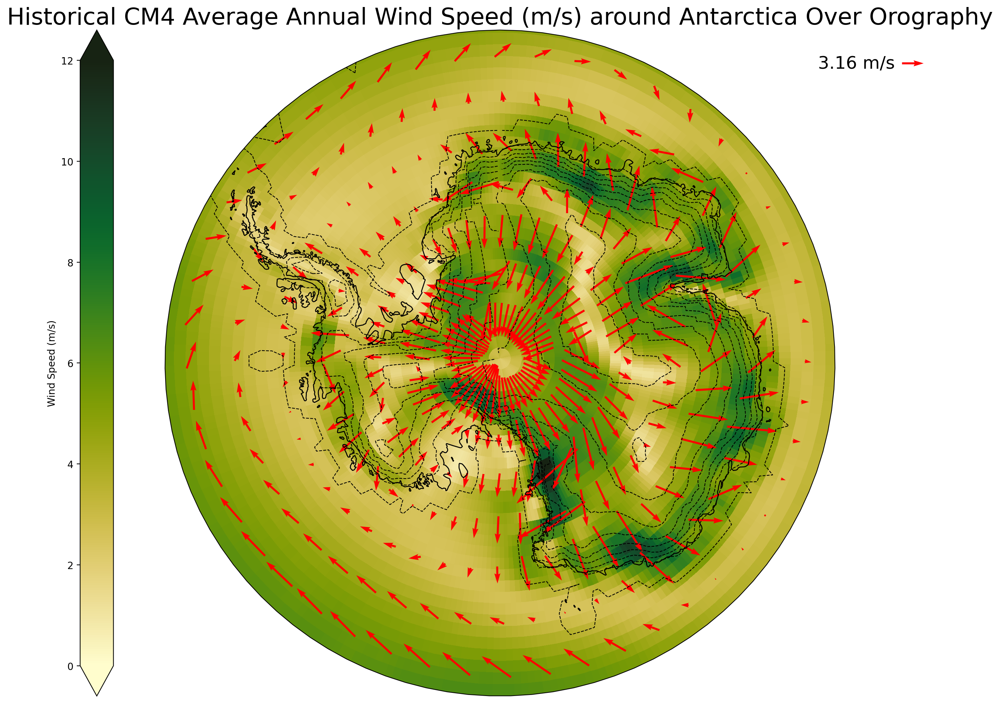

In [9]:
subplot_kws = dict(projection=ccrs.SouthPolarStereo())
fig, ax = plt.subplots(figsize=[15, 10], subplot_kw=subplot_kws)

# Plotting speed slice
cm4_his_speedslice.plot(ax=ax,
                transform=ccrs.PlateCarree(),
                vmin=0,
                vmax=12,
                extend='both', cmap=cmocean.cm.speed,cbar_kwargs={
                    'orientation': 'vertical',
                    'pad': 0.05,
                    'location': 'left',
                    'label': 'Wind Speed (m/s)'})

# Plotting contour of orography
cm4_orog.plot.contour(ax=ax,
                               transform=ccrs.PlateCarree(),
                               vmin=0,
                               vmax=3600,
                               extend='both',
                               colors='k',
                               levels=10,
                               linewidths=0.8,
                               linestyles='--')

# Limit the map to -50 degrees latitude and below
ax.set_extent([-180, 180, -90, -60], ccrs.PlateCarree())

# Create a circular boundary around the plot
theta = np.linspace(0, 2 * np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)
ax.set_boundary(circle, transform=ax.transAxes)
ax.coastlines()

# Calculate the avg magnitude of the vectors
uas = cm4_his_timeaveragemerge['uas'].values
vas = cm4_his_timeaveragemerge['vas'].values
avg_mag = np.sqrt(uas**2 + vas**2)
avg=avg_mag.mean()


# Plot the quiver and store the Quiver object (chat helped produce this code)
q = cm4_his_timeaveragemerge.isel(lon=slice(None, None, 6), lat=slice(3, 36, 4)).plot.quiver(
    x='lon',
    y='lat',
    u='uas',
    v='vas',
    width=0.003,
    scale=98,
    color='red',add_guide = False,
    transform=ccrs.PlateCarree()
)

# Add a quiver key with the automatically determined scale
ax.quiverkey(q, X=1.1, Y=.95, U=avg, label=f'{avg:.2f} m/s', labelpos='W',fontproperties={'size':18})

plt.tight_layout()
plt.title('Historical CM4 Average Annual Wind Speed (m/s) around Antarctica Over Orography',fontsize=24)
plt.show()

---

## <span style="color:blue">CM4 SSP585</span>

### CM4 SSP585 Orography Data

In [10]:
d_orog_ssp = pd.read_csv('https://storage.googleapis.com/cmip6/cmip6-zarr-consolidated-stores.csv') # importing google data
df_orog_cm4_ssp = d_orog_ssp.query("source_id=='GFDL-CM4' & experiment_id == 'ssp585' & variable_id == 'orog' & grid_label=='gr1'")

gcs = gcsfs.GCSFileSystem(token='anon')
zstore = df_orog_cm4_ssp.zstore.values[-1]
mapper = gcs.get_mapper(zstore)
cm4_orog_ssp_open = xr.open_zarr(mapper, consolidated=True) #isolated dataset


cm4_ssp585_orog = cm4_orog_ssp_open.orog #extracting orography
cm4_ssp585_orog

<xarray.DataArray 'orog' (lat: 180, lon: 288)>
dask.array<open_dataset-orog, shape=(180, 288), dtype=float32, chunksize=(180, 288), chunktype=numpy.ndarray>
Coordinates:
  * lat      (lat) float64 -89.5 -88.5 -87.5 -86.5 -85.5 ... 86.5 87.5 88.5 89.5
  * lon      (lon) float64 0.625 1.875 3.125 4.375 ... 355.6 356.9 358.1 359.4
Attributes:
    cell_measures:  area: areacella
    cell_methods:   area: mean
    interp_method:  conserve_order1
    long_name:      Surface Altitude
    original_name:  orog
    standard_name:  surface_altitude
    units:          m

### uas wind component

In [11]:
##importing Eastward Near-Surface Wind data from google cloud. Amon
df_uas_cm4_ssp = pd.read_csv('https://storage.googleapis.com/cmip6/cmip6-zarr-consolidated-stores.csv')	
# step two … # replace with the id you need and other info to ween down datasets 
df_u_cm4_ssp = df_uas_cm4_ssp.query("source_id=='GFDL-CM4' & experiment_id == 'ssp585' & variable_id == 'uas'& table_id == 'Amon'")
# step three - loading in the data and storing it
gcs = gcsfs.GCSFileSystem(token='anon')
zstore = df_u_cm4_ssp.zstore.values[-1]
mapper = gcs.get_mapper(zstore)
cm4_uas_ssp_open = xr.open_zarr(mapper, consolidated=True)

cm4_uas_ssp=cm4_uas_ssp_open.uas
cm4_uas_ssp

<xarray.DataArray 'uas' (time: 1032, lat: 180, lon: 288)>
dask.array<open_dataset-uas, shape=(1032, 180, 288), dtype=float32, chunksize=(612, 180, 288), chunktype=numpy.ndarray>
Coordinates:
    height   float64 ...
  * lat      (lat) float64 -89.5 -88.5 -87.5 -86.5 -85.5 ... 86.5 87.5 88.5 89.5
  * lon      (lon) float64 0.625 1.875 3.125 4.375 ... 355.6 356.9 358.1 359.4
  * time     (time) object 2015-01-16 12:00:00 ... 2100-12-16 12:00:00
Attributes:
    cell_measures:  area: areacella
    cell_methods:   area: time: mean
    interp_method:  conserve_order2
    long_name:      Eastward Near-Surface Wind
    original_name:  uas
    standard_name:  eastward_wind
    units:          m s-1

### vas wind component

In [12]:
##importing northward Near-Surface Wind data from google cloud. Amon
df_vas_cm4_ssp = pd.read_csv('https://storage.googleapis.com/cmip6/cmip6-zarr-consolidated-stores.csv')

# step two … # replace with the id you need and other info to ween down datasets 
df_v_cm4_ssp =df_vas_cm4_ssp.query("source_id=='GFDL-CM4' & experiment_id == 'ssp585' & variable_id == 'vas'& table_id == 'Amon'")

# step three - loading in the data and storing it
gcs = gcsfs.GCSFileSystem(token='anon')
zstore = df_v_cm4_ssp.zstore.values[-1]
mapper = gcs.get_mapper(zstore)
ds_vas_cm4_ssp = xr.open_zarr(mapper, consolidated=True)

cm4_vas_ssp=ds_vas_cm4_ssp.vas
cm4_vas_ssp

<xarray.DataArray 'vas' (time: 1032, lat: 180, lon: 288)>
dask.array<open_dataset-vas, shape=(1032, 180, 288), dtype=float32, chunksize=(597, 180, 288), chunktype=numpy.ndarray>
Coordinates:
    height   float64 ...
  * lat      (lat) float64 -89.5 -88.5 -87.5 -86.5 -85.5 ... 86.5 87.5 88.5 89.5
  * lon      (lon) float64 0.625 1.875 3.125 4.375 ... 355.6 356.9 358.1 359.4
  * time     (time) object 2015-01-16 12:00:00 ... 2100-12-16 12:00:00
Attributes:
    cell_measures:  area: areacella
    cell_methods:   area: time: mean
    interp_method:  conserve_order2
    long_name:      Northward Near-Surface Wind
    original_name:  vas
    standard_name:  northward_wind
    units:          m s-1

### merging winds

In [13]:
cm4_uas_ssp

<xarray.DataArray 'uas' (time: 1032, lat: 180, lon: 288)>
dask.array<open_dataset-uas, shape=(1032, 180, 288), dtype=float32, chunksize=(612, 180, 288), chunktype=numpy.ndarray>
Coordinates:
    height   float64 ...
  * lat      (lat) float64 -89.5 -88.5 -87.5 -86.5 -85.5 ... 86.5 87.5 88.5 89.5
  * lon      (lon) float64 0.625 1.875 3.125 4.375 ... 355.6 356.9 358.1 359.4
  * time     (time) object 2015-01-16 12:00:00 ... 2100-12-16 12:00:00
Attributes:
    cell_measures:  area: areacella
    cell_methods:   area: time: mean
    interp_method:  conserve_order2
    long_name:      Eastward Near-Surface Wind
    original_name:  uas
    standard_name:  eastward_wind
    units:          m s-1

In [14]:
#isolating a 20 year time period 
cm4_uas_ssp_time_slice=cm4_uas_ssp.sel(time=slice('2081-01-16','2100-12-16'))
cm4_uas_ssp_time_slice

<xarray.DataArray 'uas' (time: 240, lat: 180, lon: 288)>
dask.array<getitem, shape=(240, 180, 288), dtype=float32, chunksize=(240, 180, 288), chunktype=numpy.ndarray>
Coordinates:
    height   float64 ...
  * lat      (lat) float64 -89.5 -88.5 -87.5 -86.5 -85.5 ... 86.5 87.5 88.5 89.5
  * lon      (lon) float64 0.625 1.875 3.125 4.375 ... 355.6 356.9 358.1 359.4
  * time     (time) object 2081-01-16 12:00:00 ... 2100-12-16 12:00:00
Attributes:
    cell_measures:  area: areacella
    cell_methods:   area: time: mean
    interp_method:  conserve_order2
    long_name:      Eastward Near-Surface Wind
    original_name:  uas
    standard_name:  eastward_wind
    units:          m s-1

In [15]:
#isolating a 20 year time period 
cm4_vas_ssp_time_slice=cm4_vas_ssp.sel(time=slice('2081-01-16','2100-12-16'))
cm4_vas_ssp_time_slice

<xarray.DataArray 'vas' (time: 240, lat: 180, lon: 288)>
dask.array<getitem, shape=(240, 180, 288), dtype=float32, chunksize=(240, 180, 288), chunktype=numpy.ndarray>
Coordinates:
    height   float64 ...
  * lat      (lat) float64 -89.5 -88.5 -87.5 -86.5 -85.5 ... 86.5 87.5 88.5 89.5
  * lon      (lon) float64 0.625 1.875 3.125 4.375 ... 355.6 356.9 358.1 359.4
  * time     (time) object 2081-01-16 12:00:00 ... 2100-12-16 12:00:00
Attributes:
    cell_measures:  area: areacella
    cell_methods:   area: time: mean
    interp_method:  conserve_order2
    long_name:      Northward Near-Surface Wind
    original_name:  vas
    standard_name:  northward_wind
    units:          m s-1

In [16]:
cm4_ssp_mergewinds = xr.merge([cm4_uas_ssp_time_slice,cm4_vas_ssp_time_slice]) # merge winds to get a single wind speed
cm4_ssp_xmerge = cm4_ssp_mergewinds.lon #extracting the longitude component from the mergewinds array to get position for the quiver plot
cm4_ssp_ymerge = cm4_ssp_mergewinds.lat #extracting the latitude component from the mergewinds array to get position for the quiver plot
cm4_ssp_umerge = cm4_ssp_mergewinds.uas #extracting uas component to get the magnitude of vector for quiver plot
cm4_ssp_vmerge = cm4_ssp_mergewinds.vas #extracting vas component to get the magnitude of vector for quiver plot
cm4_ssp_speedmerge = np.sqrt(np.square(cm4_ssp_umerge) + np.square(cm4_ssp_vmerge)) ## calculating speed using vector formula

## tssp is the time
cm4_ssp_timeaveragemerge = cm4_ssp_mergewinds.mean(dim='time')

#tssp is the speed variable
cm4_ssp_speedslice = cm4_ssp_speedmerge.mean(dim='time')

### Creating Quiver Plot

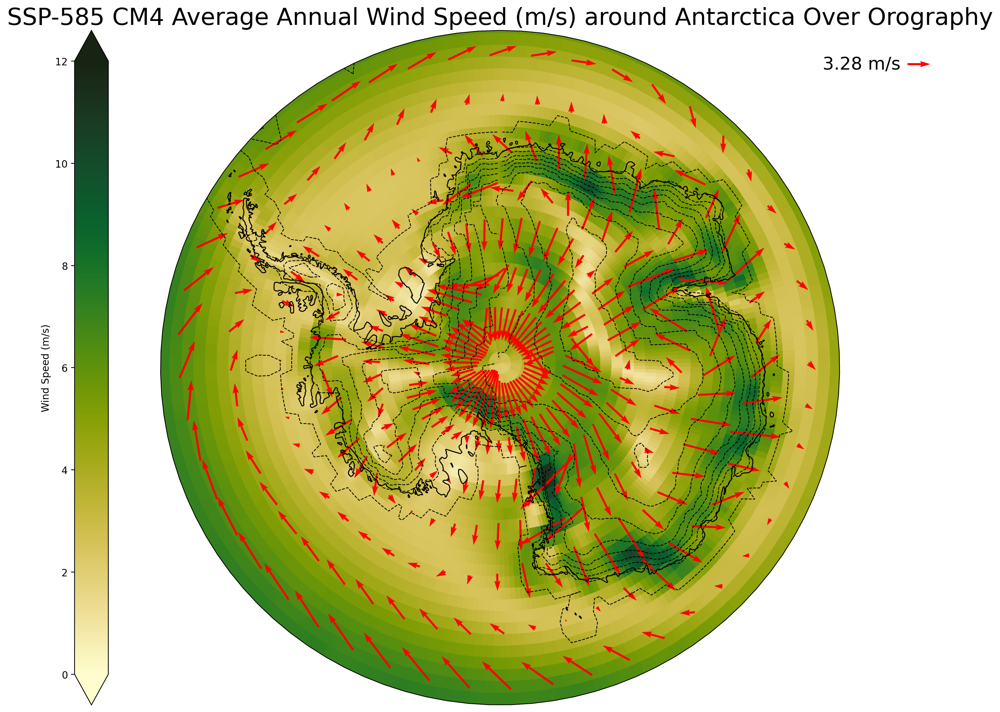

In [24]:
subplot_kws = dict(projection=ccrs.SouthPolarStereo())
fig, ax = plt.subplots(figsize=[15, 10], subplot_kw=subplot_kws)

# Plotting speed slice
cm4_ssp_speedslice.plot(ax=ax,
                transform=ccrs.PlateCarree(),
                vmin=0,
                vmax=12,
                extend='both', cmap=cmocean.cm.speed,cbar_kwargs={
                    'orientation': 'vertical',
                    'pad': 0.05,
                    'location': 'left',
                    'label': 'Wind Speed (m/s)'})

# Plotting contour of orography
cm4_ssp585_orog.plot.contour(ax=ax,
                               transform=ccrs.PlateCarree(),
                               vmin=0,
                               vmax=3600,
                               extend='both',
                               colors='k',
                               levels=10,
                               linewidths=0.8,
                               linestyles='--')

# Limit the map to -50 degrees latitude and below
ax.set_extent([-180, 180, -90, -60], ccrs.PlateCarree())

# Create a circular boundary around the plot
theta = np.linspace(0, 2 * np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)
ax.set_boundary(circle, transform=ax.transAxes)
ax.coastlines()

# Calculate the avg magnitude of the vectors
uas = cm4_ssp_timeaveragemerge['uas'].values
vas = cm4_ssp_timeaveragemerge['vas'].values
avg_mag = np.sqrt(uas**2 + vas**2)
avg=avg_mag.mean()


# Plot the quiver and store the Quiver object (chat helped produce this code)
q = cm4_ssp_timeaveragemerge.isel(lon=slice(None, None, 6), lat=slice(3, 36, 4)).plot.quiver(
    x='lon',
    y='lat',
    u='uas',
    v='vas',
    width=0.003,
    scale=98,
    color='red',add_guide = False,
    transform=ccrs.PlateCarree()
)

# Add a quiver key with the automatically determined scale
ax.quiverkey(q, X=1.1, Y=.95, U=avg, label=f'{avg:.2f} m/s', labelpos='W',fontproperties={'size':18})

plt.tight_layout()
plt.title('SSP-585 CM4 Average Annual Wind Speed (m/s) around Antarctica Over Orography',fontsize=24)
plt.show()

---

# ESM4

### ESM4 Historical Orography

In [18]:
d_orog_e4_his = pd.read_csv('https://storage.googleapis.com/cmip6/cmip6-zarr-consolidated-stores.csv') # importing google data
df_orog_e4_his = d_orog_e4_his.query("source_id=='GFDL-CM4' & experiment_id == 'historical' & variable_id == 'orog' & grid_label=='gr1'")

gcs = gcsfs.GCSFileSystem(token='anon')
zstore = df_orog_e4_his.zstore.values[-1]
mapper = gcs.get_mapper(zstore)
e4_orog_his_open = xr.open_zarr(mapper, consolidated=True) #isolated dataset


esm4_his_orog = e4_orog_his_open.orog #extracting orography
esm4_his_orog

<xarray.DataArray 'orog' (lat: 180, lon: 288)>
dask.array<open_dataset-orog, shape=(180, 288), dtype=float32, chunksize=(180, 288), chunktype=numpy.ndarray>
Coordinates:
  * lat      (lat) float64 -89.5 -88.5 -87.5 -86.5 -85.5 ... 86.5 87.5 88.5 89.5
  * lon      (lon) float64 0.625 1.875 3.125 4.375 ... 355.6 356.9 358.1 359.4
Attributes:
    cell_measures:  area: areacella
    cell_methods:   area: mean
    interp_method:  conserve_order1
    long_name:      Surface Altitude
    original_name:  orog
    standard_name:  surface_altitude
    units:          m

## <span style="color:red">ESM4 Historical</span>

### uas wind component

In [25]:
esm4 = pd.read_csv('https://storage.googleapis.com/cmip6/cmip6-zarr-consolidated-stores.csv')
#defines the Eastward Near-Surface Wind
gfdl_esm4_uas_data = esm4.query(
    "table_id == 'Amon' & \
    variable_id == 'uas' & \
    experiment_id == 'historical' & \
    institution_id == 'NOAA-GFDL' &  \
    source_id == 'GFDL-ESM4'")

gcs = gcsfs.GCSFileSystem(token='anon')
zstore_esm4_uas = gfdl_esm4_uas_data.zstore.values[-1]
mapper_esm4_uas = gcs.get_mapper(zstore_esm4_uas)

esm4_uas = xr.open_zarr(mapper_esm4_uas, 
                                consolidated=True,use_cftime=True)
esm4_uas_historical=esm4_uas.uas #extracting the uas variable
esm4_uas_historical

<xarray.DataArray 'uas' (time: 1980, lat: 180, lon: 288)>
dask.array<open_dataset-uas, shape=(1980, 180, 288), dtype=float32, chunksize=(611, 180, 288), chunktype=numpy.ndarray>
Coordinates:
    height   float64 ...
  * lat      (lat) float64 -89.5 -88.5 -87.5 -86.5 -85.5 ... 86.5 87.5 88.5 89.5
  * lon      (lon) float64 0.625 1.875 3.125 4.375 ... 355.6 356.9 358.1 359.4
  * time     (time) object 1850-01-16 12:00:00 ... 2014-12-16 12:00:00
Attributes:
    cell_measures:  area: areacella
    cell_methods:   area: time: mean
    interp_method:  conserve_order2
    long_name:      Eastward Near-Surface Wind
    original_name:  uas
    standard_name:  eastward_wind
    units:          m s-1

### vas wind component

In [26]:
#defines the NorthWard Near-Surface Wind
gfdl_esm4_vas_data = esm4.query(
    "table_id == 'Amon' & \
    variable_id == 'vas' & \
    experiment_id == 'historical' & \
    institution_id == 'NOAA-GFDL' &  \
    source_id == 'GFDL-ESM4'")

zstore_esm4_vas = gfdl_esm4_vas_data.zstore.values[-1]
mapper_esm4_vas = gcs.get_mapper(zstore_esm4_vas)

esm4_vas = xr.open_zarr(mapper_esm4_vas, 
                                consolidated=True,use_cftime=True)
esm4_vas_historical=esm4_vas.vas
esm4_vas_historical

<xarray.DataArray 'vas' (time: 1980, lat: 180, lon: 288)>
dask.array<open_dataset-vas, shape=(1980, 180, 288), dtype=float32, chunksize=(596, 180, 288), chunktype=numpy.ndarray>
Coordinates:
    height   float64 ...
  * lat      (lat) float64 -89.5 -88.5 -87.5 -86.5 -85.5 ... 86.5 87.5 88.5 89.5
  * lon      (lon) float64 0.625 1.875 3.125 4.375 ... 355.6 356.9 358.1 359.4
  * time     (time) object 1850-01-16 12:00:00 ... 2014-12-16 12:00:00
Attributes:
    cell_measures:  area: areacella
    cell_methods:   area: time: mean
    interp_method:  conserve_order2
    long_name:      Northward Near-Surface Wind
    original_name:  vas
    standard_name:  northward_wind
    units:          m s-1

### merging winds

In [27]:
#isolating a 20 year time period 
esm4_uas_his_time_slice=esm4_uas_historical.sel(time=slice('1995-01-16','2014-12-16'))
esm4_uas_his_time_slice

<xarray.DataArray 'uas' (time: 240, lat: 180, lon: 288)>
dask.array<getitem, shape=(240, 180, 288), dtype=float32, chunksize=(147, 180, 288), chunktype=numpy.ndarray>
Coordinates:
    height   float64 ...
  * lat      (lat) float64 -89.5 -88.5 -87.5 -86.5 -85.5 ... 86.5 87.5 88.5 89.5
  * lon      (lon) float64 0.625 1.875 3.125 4.375 ... 355.6 356.9 358.1 359.4
  * time     (time) object 1995-01-16 12:00:00 ... 2014-12-16 12:00:00
Attributes:
    cell_measures:  area: areacella
    cell_methods:   area: time: mean
    interp_method:  conserve_order2
    long_name:      Eastward Near-Surface Wind
    original_name:  uas
    standard_name:  eastward_wind
    units:          m s-1

In [28]:
#isolating a 20 year time period 
esm4_vas_his_time_slice=esm4_vas_historical.sel(time=slice('1995-01-16','2014-12-16'))
esm4_vas_his_time_slice

<xarray.DataArray 'vas' (time: 240, lat: 180, lon: 288)>
dask.array<getitem, shape=(240, 180, 288), dtype=float32, chunksize=(192, 180, 288), chunktype=numpy.ndarray>
Coordinates:
    height   float64 ...
  * lat      (lat) float64 -89.5 -88.5 -87.5 -86.5 -85.5 ... 86.5 87.5 88.5 89.5
  * lon      (lon) float64 0.625 1.875 3.125 4.375 ... 355.6 356.9 358.1 359.4
  * time     (time) object 1995-01-16 12:00:00 ... 2014-12-16 12:00:00
Attributes:
    cell_measures:  area: areacella
    cell_methods:   area: time: mean
    interp_method:  conserve_order2
    long_name:      Northward Near-Surface Wind
    original_name:  vas
    standard_name:  northward_wind
    units:          m s-1

In [29]:
esm4_his_mergewinds = xr.merge([esm4_uas_his_time_slice,esm4_vas_his_time_slice]) # merge winds to get a single wind speed
esm4_his_xmerge = esm4_his_mergewinds.lon #extracting the longitude component from the mergewinds array to get position for the quiver plot
esm4_his_ymerge = esm4_his_mergewinds.lat #extracting the latitude component from the mergewinds array to get position for the quiver plot
esm4_his_umerge = esm4_his_mergewinds.uas #extracting uas component to get the magnitude of vector for quiver plot
esm4_his_vmerge = esm4_his_mergewinds.vas #extracting vas component to get the magnitude of vector for quiver plot
esm4_his_speedmerge = np.sqrt(np.square(esm4_his_umerge) + np.square(esm4_his_vmerge)) ## calculating speed using vector formula

## this is the time
esm4_his_timeaveragemerge = esm4_his_mergewinds.mean(dim='time')

#this is the speed variable
esm4_his_speedslice = esm4_his_speedmerge.mean(dim='time')

### creating quiver plot

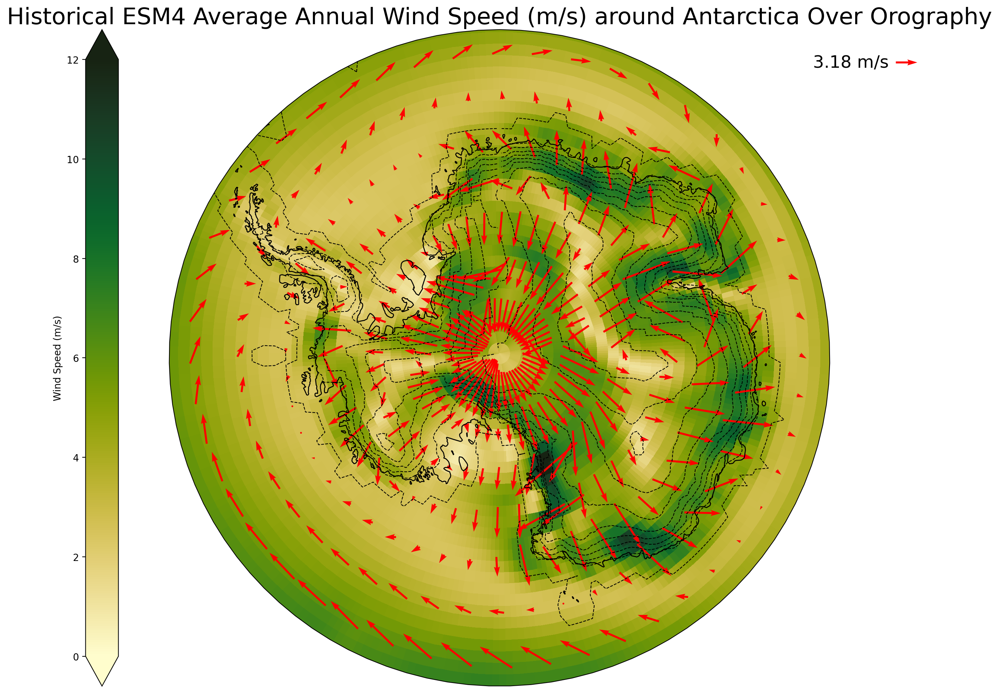

In [31]:
subplot_kws = dict(projection=ccrs.SouthPolarStereo())
fig, ax = plt.subplots(figsize=[15, 10], subplot_kw=subplot_kws)

# Plotting speed slice
esm4_his_speedslice.plot(ax=ax,
                transform=ccrs.PlateCarree(),
                vmin=0,
                vmax=12,
                extend='both', cmap=cmocean.cm.speed,cbar_kwargs={
                    'orientation': 'vertical',
                    'pad': 0.05,
                    'location': 'left',
                    'label': 'Wind Speed (m/s)'})

# Plotting contour of orography
esm4_his_orog.plot.contour(ax=ax,
                               transform=ccrs.PlateCarree(),
                               vmin=0,
                               vmax=3600,
                               extend='both',
                               colors='k',
                               levels=10,
                               linewidths=0.8,
                               linestyles='--')

# Limit the map to -50 degrees latitude and below
ax.set_extent([-180, 180, -90, -60], ccrs.PlateCarree())

# Create a circular boundary around the plot
theta = np.linspace(0, 2 * np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)
ax.set_boundary(circle, transform=ax.transAxes)
ax.coastlines()

# Calculate the avg magnitude of the vectors
uas = esm4_his_timeaveragemerge['uas'].values
vas = esm4_his_timeaveragemerge['vas'].values
avg_mag = np.sqrt(uas**2 + vas**2)
avg=avg_mag.mean()


# Plot the quiver and store the Quiver object (chat helped produce this code)
q = esm4_his_timeaveragemerge.isel(lon=slice(None, None, 6), lat=slice(3, 36, 4)).plot.quiver(
    x='lon',
    y='lat',
    u='uas',
    v='vas',
    width=0.003,
    scale=98,
    color='red',add_guide = False,
    transform=ccrs.PlateCarree()
)

# Add a quiver key with the automatically determined scale
ax.quiverkey(q, X=1.1, Y=.95, U=avg, label=f'{avg:.2f} m/s', labelpos='W',fontproperties={'size':18})

plt.tight_layout()
plt.title('Historical ESM4 Average Annual Wind Speed (m/s) around Antarctica Over Orography',fontsize=24)
plt.show()

---

## <span style="color:red">ESM4 SSP585</span>

### ESM4 SSP585 Orography

In [36]:
d_orog_e4_ssp = pd.read_csv('https://storage.googleapis.com/cmip6/cmip6-zarr-consolidated-stores.csv') # importing google data
df_orog_e4_ssp = d_orog_e4_ssp.query("source_id=='GFDL-CM4' & experiment_id == 'ssp585' & variable_id == 'orog' & grid_label=='gr1'")

gcs = gcsfs.GCSFileSystem(token='anon')
zstore = df_orog_e4_ssp.zstore.values[-1]
mapper = gcs.get_mapper(zstore)
e4_orog_ssp_open = xr.open_zarr(mapper, consolidated=True) #isolated dataset


esm4_ssp_orog = e4_orog_ssp_open.orog #extracting orography
esm4_ssp_orog

<xarray.DataArray 'orog' (lat: 180, lon: 288)>
dask.array<open_dataset-orog, shape=(180, 288), dtype=float32, chunksize=(180, 288), chunktype=numpy.ndarray>
Coordinates:
  * lat      (lat) float64 -89.5 -88.5 -87.5 -86.5 -85.5 ... 86.5 87.5 88.5 89.5
  * lon      (lon) float64 0.625 1.875 3.125 4.375 ... 355.6 356.9 358.1 359.4
Attributes:
    cell_measures:  area: areacella
    cell_methods:   area: mean
    interp_method:  conserve_order1
    long_name:      Surface Altitude
    original_name:  orog
    standard_name:  surface_altitude
    units:          m

### uas wind component

In [37]:
esm4 = pd.read_csv('https://storage.googleapis.com/cmip6/cmip6-zarr-consolidated-stores.csv')
#defines the Eastward Near-Surface Wind
gfdl_esm4_uas_data = esm4.query(
    "table_id == 'Amon' & \
    variable_id == 'uas' & \
    experiment_id == 'ssp585' & \
    institution_id == 'NOAA-GFDL' &  \
    source_id == 'GFDL-ESM4'")

gcs = gcsfs.GCSFileSystem(token='anon')
zstore_esm4_uas = gfdl_esm4_uas_data.zstore.values[-1]
mapper_esm4_uas = gcs.get_mapper(zstore_esm4_uas)

esm4_uas = xr.open_zarr(mapper_esm4_uas, 
                                consolidated=True,use_cftime=True)
esm4_uas_ssp=esm4_uas.uas #extracting the uas variable
esm4_uas_ssp

<xarray.DataArray 'uas' (time: 1032, lat: 180, lon: 288)>
dask.array<open_dataset-uas, shape=(1032, 180, 288), dtype=float32, chunksize=(613, 180, 288), chunktype=numpy.ndarray>
Coordinates:
    height   float64 ...
  * lat      (lat) float64 -89.5 -88.5 -87.5 -86.5 -85.5 ... 86.5 87.5 88.5 89.5
  * lon      (lon) float64 0.625 1.875 3.125 4.375 ... 355.6 356.9 358.1 359.4
  * time     (time) object 2015-01-16 12:00:00 ... 2100-12-16 12:00:00
Attributes:
    cell_measures:  area: areacella
    cell_methods:   area: time: mean
    interp_method:  conserve_order2
    long_name:      Eastward Near-Surface Wind
    original_name:  uas
    standard_name:  eastward_wind
    units:          m s-1

### vas wind component

In [38]:
esm4 = pd.read_csv('https://storage.googleapis.com/cmip6/cmip6-zarr-consolidated-stores.csv')
#defines the Eastward Near-Surface Wind
gfdl_esm4_vas_data = esm4.query(
    "table_id == 'Amon' & \
    variable_id == 'vas' & \
    experiment_id == 'ssp585' & \
    institution_id == 'NOAA-GFDL' &  \
    source_id == 'GFDL-ESM4'")

gcs = gcsfs.GCSFileSystem(token='anon')
zstore_esm4_vas = gfdl_esm4_vas_data.zstore.values[-1]
mapper_esm4_vas = gcs.get_mapper(zstore_esm4_vas)

esm4_vas = xr.open_zarr(mapper_esm4_vas, 
                                consolidated=True,use_cftime=True)
esm4_vas_ssp=esm4_vas.vas #extracting the vas variable
esm4_vas_ssp

<xarray.DataArray 'vas' (time: 1032, lat: 180, lon: 288)>
dask.array<open_dataset-vas, shape=(1032, 180, 288), dtype=float32, chunksize=(596, 180, 288), chunktype=numpy.ndarray>
Coordinates:
    height   float64 ...
  * lat      (lat) float64 -89.5 -88.5 -87.5 -86.5 -85.5 ... 86.5 87.5 88.5 89.5
  * lon      (lon) float64 0.625 1.875 3.125 4.375 ... 355.6 356.9 358.1 359.4
  * time     (time) object 2015-01-16 12:00:00 ... 2100-12-16 12:00:00
Attributes:
    cell_measures:  area: areacella
    cell_methods:   area: time: mean
    interp_method:  conserve_order2
    long_name:      Northward Near-Surface Wind
    original_name:  vas
    standard_name:  northward_wind
    units:          m s-1

### merging winds

In [39]:
#isolating a 20 year time period 
esm4_uas_ssp_time_slice=esm4_uas_ssp.sel(time=slice('2081-01-16','2100-12-16'))
esm4_uas_ssp_time_slice

<xarray.DataArray 'uas' (time: 240, lat: 180, lon: 288)>
dask.array<getitem, shape=(240, 180, 288), dtype=float32, chunksize=(240, 180, 288), chunktype=numpy.ndarray>
Coordinates:
    height   float64 ...
  * lat      (lat) float64 -89.5 -88.5 -87.5 -86.5 -85.5 ... 86.5 87.5 88.5 89.5
  * lon      (lon) float64 0.625 1.875 3.125 4.375 ... 355.6 356.9 358.1 359.4
  * time     (time) object 2081-01-16 12:00:00 ... 2100-12-16 12:00:00
Attributes:
    cell_measures:  area: areacella
    cell_methods:   area: time: mean
    interp_method:  conserve_order2
    long_name:      Eastward Near-Surface Wind
    original_name:  uas
    standard_name:  eastward_wind
    units:          m s-1

In [40]:
#isolating a 20 year time period 
esm4_vas_ssp_time_slice=esm4_vas_ssp.sel(time=slice('2081-01-16','2100-12-16'))
esm4_vas_ssp_time_slice

<xarray.DataArray 'vas' (time: 240, lat: 180, lon: 288)>
dask.array<getitem, shape=(240, 180, 288), dtype=float32, chunksize=(240, 180, 288), chunktype=numpy.ndarray>
Coordinates:
    height   float64 ...
  * lat      (lat) float64 -89.5 -88.5 -87.5 -86.5 -85.5 ... 86.5 87.5 88.5 89.5
  * lon      (lon) float64 0.625 1.875 3.125 4.375 ... 355.6 356.9 358.1 359.4
  * time     (time) object 2081-01-16 12:00:00 ... 2100-12-16 12:00:00
Attributes:
    cell_measures:  area: areacella
    cell_methods:   area: time: mean
    interp_method:  conserve_order2
    long_name:      Northward Near-Surface Wind
    original_name:  vas
    standard_name:  northward_wind
    units:          m s-1

In [41]:
esm4_ssp_mergewinds = xr.merge([esm4_uas_ssp_time_slice,esm4_vas_ssp_time_slice]) # merge winds to get a single wind speed
esm4_ssp_xmerge = esm4_ssp_mergewinds.lon #extracting the longitude component from the mergewinds array to get position for the quiver plot
esm4_ssp_ymerge = esm4_ssp_mergewinds.lat #extracting the latitude component from the mergewinds array to get position for the quiver plot
esm4_ssp_umerge = esm4_ssp_mergewinds.uas #extracting uas component to get the magnitude of vector for quiver plot
esm4_ssp_vmerge = esm4_ssp_mergewinds.vas #extracting vas component to get the magnitude of vector for quiver plot
esm4_ssp_speedmerge = np.sqrt(np.square(esm4_ssp_umerge) + np.square(esm4_ssp_vmerge)) ## calculating speed using vector formula

## time
esm4_ssp_timeaveragemerge = esm4_ssp_mergewinds.mean(dim='time')

## speed variable
esm4_ssp_speedslice = esm4_ssp_speedmerge.mean(dim='time')

In [42]:
esm4_ssp_timeaveragemerge

<xarray.Dataset>
Dimensions:  (lat: 180, lon: 288)
Coordinates:
    height   float64 10.0
  * lat      (lat) float64 -89.5 -88.5 -87.5 -86.5 -85.5 ... 86.5 87.5 88.5 89.5
  * lon      (lon) float64 0.625 1.875 3.125 4.375 ... 355.6 356.9 358.1 359.4
Data variables:
    uas      (lat, lon) float32 dask.array<chunksize=(180, 288), meta=np.ndarray>
    vas      (lat, lon) float32 dask.array<chunksize=(180, 288), meta=np.ndarray>

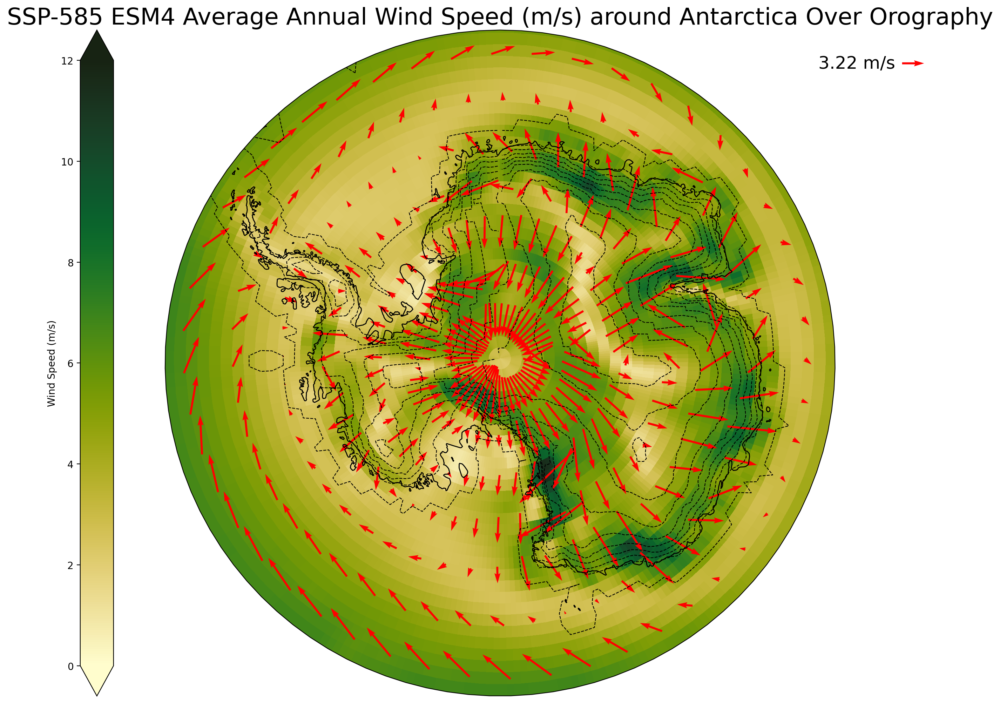

In [43]:
subplot_kws = dict(projection=ccrs.SouthPolarStereo())
fig, ax = plt.subplots(figsize=[15, 10], subplot_kw=subplot_kws)

# Plotting speed slice
esm4_ssp_speedslice.plot(ax=ax,
                transform=ccrs.PlateCarree(),
                vmin=0,
                vmax=12,
                extend='both', cmap=cmocean.cm.speed,cbar_kwargs={
                    'orientation': 'vertical',
                    'pad': 0.05,
                    'location': 'left',
                    'label': 'Wind Speed (m/s)'})

# Plotting contour of orography
esm4_ssp_orog.plot.contour(ax=ax,
                               transform=ccrs.PlateCarree(),
                               vmin=0,
                               vmax=3600,
                               extend='both',
                               colors='k',
                               levels=10,
                               linewidths=0.8,
                               linestyles='--')

# Limit the map to -50 degrees latitude and below
ax.set_extent([-180, 180, -90, -60], ccrs.PlateCarree())

# Create a circular boundary around the plot
theta = np.linspace(0, 2 * np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)
ax.set_boundary(circle, transform=ax.transAxes)
ax.coastlines()

# Calculate the avg magnitude of the vectors
uas = esm4_ssp_timeaveragemerge['uas'].values
vas = esm4_ssp_timeaveragemerge['vas'].values
avg_mag = np.sqrt(uas**2 + vas**2)
avg=avg_mag.mean()


# Plot the quiver and store the Quiver object (chat helped produce this code)
q = esm4_ssp_timeaveragemerge.isel(lon=slice(None, None, 6), lat=slice(3, 36, 4)).plot.quiver(
    x='lon',
    y='lat',
    u='uas',
    v='vas',
    width=0.003,
    scale=98,
    color='red',add_guide = False,
    transform=ccrs.PlateCarree()
)

# Add a quiver key with the automatically determined scale
ax.quiverkey(q, X=1.1, Y=.95, U=avg, label=f'{avg:.2f} m/s', labelpos='W',fontproperties={'size':18})

plt.tight_layout()
plt.title('SSP-585 ESM4 Average Annual Wind Speed (m/s) around Antarctica Over Orography',fontsize=24)
plt.show()

--- 

# CM4X

### CM4X Historical Orography

## <span style="color:green">CM4X Historical</span>

### uas wind component

In [59]:
cm4x_u_his=xr.open_mfdataset('/backup/tuq41374/model_output/cm4x/p25/historical/atmos/monthly/u_ref/*.nc')
cm4x_u_his

<xarray.Dataset>
Dimensions:     (time: 1980, bnds: 2, lat: 360, lon: 576)
Coordinates:
  * bnds        (bnds) float64 1.0 2.0
  * lat         (lat) float64 -89.75 -89.25 -88.75 -88.25 ... 88.75 89.25 89.75
  * lon         (lon) float64 0.3125 0.9375 1.562 2.188 ... 358.4 359.1 359.7
  * time        (time) object 1850-01-16 12:00:00 ... 2014-12-16 12:00:00
Data variables:
    average_DT  (time) timedelta64[ns] dask.array<chunksize=(60,), meta=np.ndarray>
    average_T1  (time) datetime64[ns] dask.array<chunksize=(60,), meta=np.ndarray>
    average_T2  (time) datetime64[ns] dask.array<chunksize=(60,), meta=np.ndarray>
    lat_bnds    (time, lat, bnds) float64 dask.array<chunksize=(60, 360, 2), meta=np.ndarray>
    lon_bnds    (time, lon, bnds) float64 dask.array<chunksize=(60, 576, 2), meta=np.ndarray>
    time_bnds   (time, bnds) object dask.array<chunksize=(60, 2), meta=np.ndarray>
    u_ref       (time, lat, lon) float32 dask.array<chunksize=(60, 360, 576), meta=np.ndarray>
Attributes:
    filename:              atmos.185001-185412.u_ref.nc
    title:                 CM4_historical_c192_OM4p25
    associated_files:      area: 18540101.grid_spec.nc
    grid_type:             regular
    grid_tile:             N/A
    code_release_version:  19.1
    git_hash:              c97c1f6afab0df3545ee82c337d51accc4205bc3
    creationtime:          Sat Dec 24 23:27:31 2022
    hostname:              pp038
    history:               fregrid --standard_dimension --input_mosaic C192_m...

### vas wind component

In [60]:
#importing northward wind output from cm4x historical simulation from backup
cm4x_v_his=xr.open_mfdataset('/backup/tuq41374/model_output/cm4x/p25/historical/atmos/monthly/v_ref/*.nc')
cm4x_v_his

<xarray.Dataset>
Dimensions:     (time: 1980, bnds: 2, lat: 360, lon: 576)
Coordinates:
  * bnds        (bnds) float64 1.0 2.0
  * lat         (lat) float64 -89.75 -89.25 -88.75 -88.25 ... 88.75 89.25 89.75
  * lon         (lon) float64 0.3125 0.9375 1.562 2.188 ... 358.4 359.1 359.7
  * time        (time) object 1850-01-16 12:00:00 ... 2014-12-16 12:00:00
Data variables:
    average_DT  (time) timedelta64[ns] dask.array<chunksize=(60,), meta=np.ndarray>
    average_T1  (time) datetime64[ns] dask.array<chunksize=(60,), meta=np.ndarray>
    average_T2  (time) datetime64[ns] dask.array<chunksize=(60,), meta=np.ndarray>
    lat_bnds    (time, lat, bnds) float64 dask.array<chunksize=(60, 360, 2), meta=np.ndarray>
    lon_bnds    (time, lon, bnds) float64 dask.array<chunksize=(60, 576, 2), meta=np.ndarray>
    time_bnds   (time, bnds) object dask.array<chunksize=(60, 2), meta=np.ndarray>
    v_ref       (time, lat, lon) float32 dask.array<chunksize=(60, 360, 576), meta=np.ndarray>
Attributes:
    filename:              atmos.185001-185412.v_ref.nc
    title:                 CM4_historical_c192_OM4p25
    associated_files:      area: 18540101.grid_spec.nc
    grid_type:             regular
    grid_tile:             N/A
    code_release_version:  19.1
    git_hash:              c97c1f6afab0df3545ee82c337d51accc4205bc3
    creationtime:          Sat Dec 24 23:27:31 2022
    hostname:              pp038
    history:               fregrid --standard_dimension --input_mosaic C192_m...

### merging winds

In [62]:
#slicing a 20 year period
cm4x_uas_his=cm4x_u_his.u_ref.sel(time=slice('1995-01-16','2014-12-16'))
cm4x_uas_his

<xarray.DataArray 'u_ref' (time: 240, lat: 360, lon: 576)>
dask.array<getitem, shape=(240, 360, 576), dtype=float32, chunksize=(60, 360, 576), chunktype=numpy.ndarray>
Coordinates:
  * lat      (lat) float64 -89.75 -89.25 -88.75 -88.25 ... 88.75 89.25 89.75
  * lon      (lon) float64 0.3125 0.9375 1.562 2.188 ... 357.8 358.4 359.1 359.7
  * time     (time) object 1995-01-16 12:00:00 ... 2014-12-16 12:00:00
Attributes:
    long_name:      zonal wind component at 10 m
    units:          m/s
    valid_range:    [-400.  400.]
    cell_methods:   time: mean
    time_avg_info:  average_T1,average_T2,average_DT
    interp_method:  conserve_order2

In [63]:
#slicing a 20 year period
cm4x_vas_his=cm4x_v_his.v_ref.sel(time=slice('1995-01-16','2014-12-16'))
cm4x_vas_his

<xarray.DataArray 'v_ref' (time: 240, lat: 360, lon: 576)>
dask.array<getitem, shape=(240, 360, 576), dtype=float32, chunksize=(60, 360, 576), chunktype=numpy.ndarray>
Coordinates:
  * lat      (lat) float64 -89.75 -89.25 -88.75 -88.25 ... 88.75 89.25 89.75
  * lon      (lon) float64 0.3125 0.9375 1.562 2.188 ... 357.8 358.4 359.1 359.7
  * time     (time) object 1995-01-16 12:00:00 ... 2014-12-16 12:00:00
Attributes:
    long_name:      meridional wind component at 10 m
    units:          m/s
    valid_range:    [-400.  400.]
    cell_methods:   time: mean
    time_avg_info:  average_T1,average_T2,average_DT
    interp_method:  conserve_order2

In [68]:
cm4x_his_mergewinds = xr.merge([cm4x_uas_his,cm4x_vas_his]) # merge winds to make it easy
cm4x_his_mergewinds_xmerge = cm4x_his_mergewinds.lon #extracting the lon component fomr the mergewinds array
cm4x_his_mergewinds_ymerge = cm4x_his_mergewinds.lat
cm4x_his_mergewinds_umerge = cm4x_his_mergewinds.u_ref 
cm4x_his_mergewinds_vmerge = cm4x_his_mergewinds.v_ref
cm4x_his_speedmerge = np.sqrt(np.square(cm4x_his_mergewinds_umerge) + np.square(cm4x_his_mergewinds_vmerge)) ## calculating speed using vector formula

## speed / magnitude variable
cm4x_his_speedslice = cm4x_his_speedmerge.mean(dim='time')
## position variable
cm4x_his_position= cm4x_his_mergewinds.mean(dim='time')

In [70]:
cm4x_his_position

<xarray.Dataset>
Dimensions:  (lat: 360, lon: 576)
Coordinates:
  * lat      (lat) float64 -89.75 -89.25 -88.75 -88.25 ... 88.75 89.25 89.75
  * lon      (lon) float64 0.3125 0.9375 1.562 2.188 ... 357.8 358.4 359.1 359.7
Data variables:
    u_ref    (lat, lon) float32 dask.array<chunksize=(360, 576), meta=np.ndarray>
    v_ref    (lat, lon) float32 dask.array<chunksize=(360, 576), meta=np.ndarray>

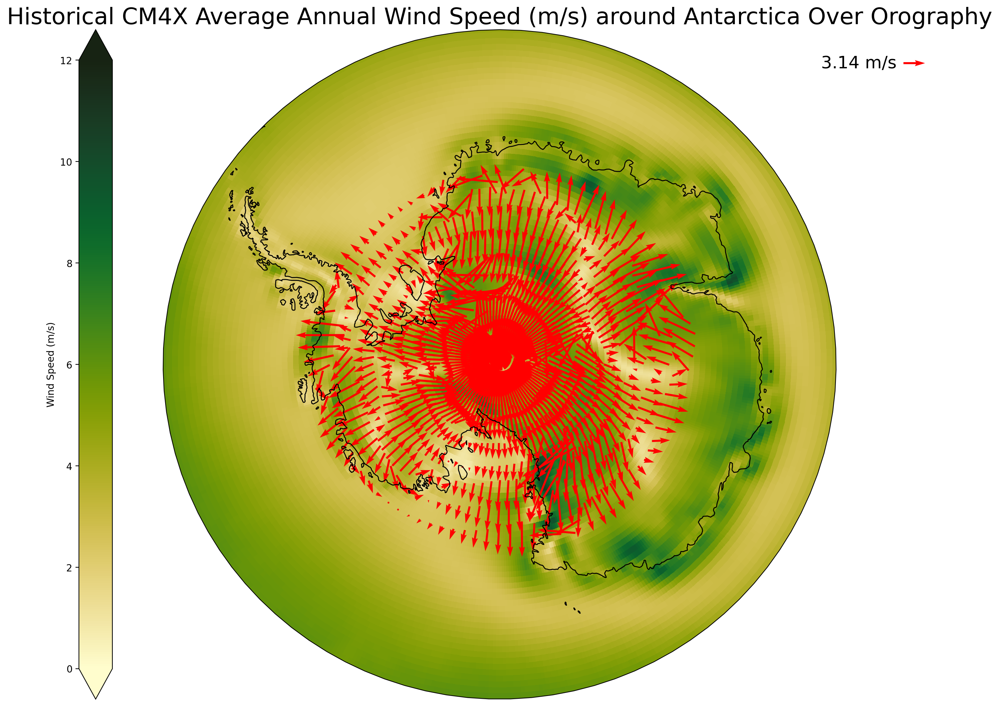

In [71]:
subplot_kws = dict(projection=ccrs.SouthPolarStereo())
fig, ax = plt.subplots(figsize=[15, 10], subplot_kw=subplot_kws)

# Plotting speed slice
cm4x_his_speedslice.plot(ax=ax,
                transform=ccrs.PlateCarree(),
                vmin=0,
                vmax=12,
                extend='both', cmap=cmocean.cm.speed,cbar_kwargs={
                    'orientation': 'vertical',
                    'pad': 0.05,
                    'location': 'left',
                    'label': 'Wind Speed (m/s)'})


# Limit the map to -50 degrees latitude and below
ax.set_extent([-180, 180, -90, -60], ccrs.PlateCarree())

# Create a circular boundary around the plot
theta = np.linspace(0, 2 * np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)
ax.set_boundary(circle, transform=ax.transAxes)
ax.coastlines()

# Calculate the avg magnitude of the vectors
uas = cm4x_his_position['u_ref'].values
vas = cm4x_his_position['v_ref'].values
avg_mag = np.sqrt(uas**2 + vas**2)
avg=avg_mag.mean()


# Plot the quiver and store the Quiver object (chat helped produce this code)
q = cm4x_his_position.isel(lon=slice(None, None, 6), lat=slice(0, 36, 4)).plot.quiver(
    x='lon',
    y='lat',
    u='u_ref',
    v='v_ref',
    width=0.003,
    scale=98,
    color='red',add_guide = False,
    transform=ccrs.PlateCarree()
)

# Add a quiver key with the automatically determined scale
ax.quiverkey(q, X=1.1, Y=.95, U=avg, label=f'{avg:.2f} m/s', labelpos='W',fontproperties={'size':18})

plt.tight_layout()
plt.title('Historical CM4X Average Annual Wind Speed (m/s) around Antarctica Over Orography',fontsize=24)
plt.show()

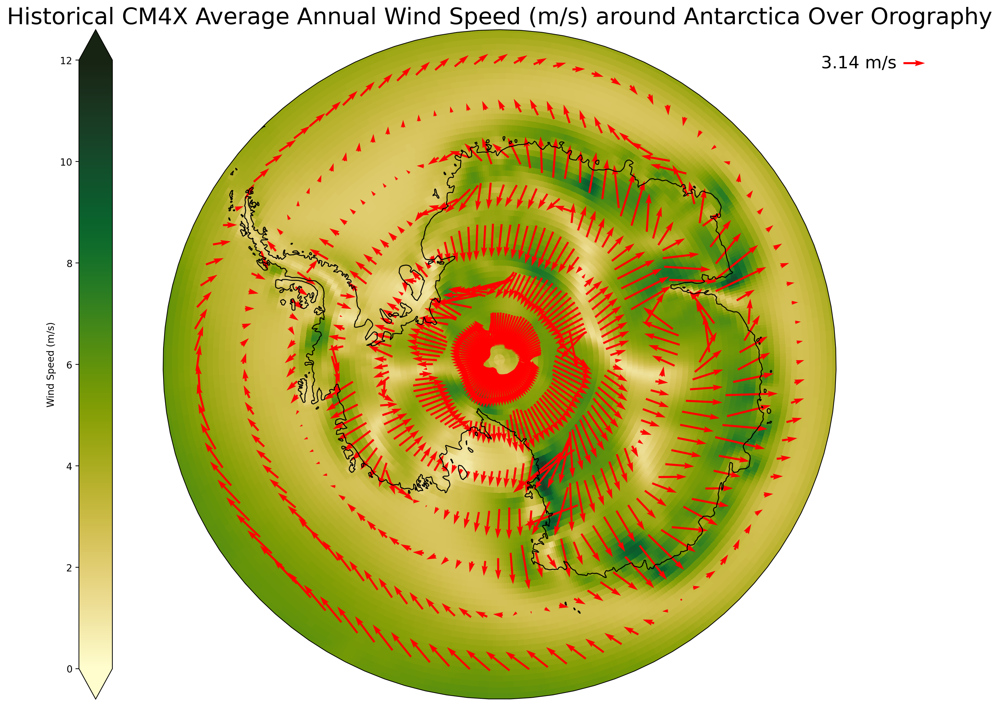

In [88]:
subplot_kws = dict(projection=ccrs.SouthPolarStereo())
fig, ax = plt.subplots(figsize=[15, 10], subplot_kw=subplot_kws)

# Plotting speed slice
cm4x_his_speedslice.plot(ax=ax,
                transform=ccrs.PlateCarree(),
                vmin=0,
                vmax=12,
                extend='both', cmap=cmocean.cm.speed,cbar_kwargs={
                    'orientation': 'vertical',
                    'pad': 0.05,
                    'location': 'left',
                    'label': 'Wind Speed (m/s)'})


# Limit the map to -50 degrees latitude and below
ax.set_extent([-180, 180, -90, -60], ccrs.PlateCarree())

# Create a circular boundary around the plot
theta = np.linspace(0, 2 * np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)
ax.set_boundary(circle, transform=ax.transAxes)
ax.coastlines()

# Calculate the avg magnitude of the vectors
uas = cm4x_his_position['u_ref'].values
vas = cm4x_his_position['v_ref'].values
avg_mag = np.sqrt(uas**2 + vas**2)
avg=avg_mag.mean()


# Plot the quiver and store the Quiver object (chat helped produce this code)
q = cm4x_his_position.isel(lon=slice(None, None, 6), lat=slice(5, 60, 8)).plot.quiver(
    x='lon',
    y='lat',
    u='u_ref',
    v='v_ref',
    width=0.003,
    scale=98,
    color='red',add_guide = False,
    transform=ccrs.PlateCarree()
)

# Add a quiver key with the automatically determined scale
ax.quiverkey(q, X=1.1, Y=.95, U=avg, label=f'{avg:.2f} m/s', labelpos='W',fontproperties={'size':18})

plt.tight_layout()
plt.title('Historical CM4X Average Annual Wind Speed (m/s) around Antarctica Over Orography',fontsize=24)
plt.show()

--- 

## <span style="color:green">CM4X SSP585</span>

### uas wind component

In [83]:
cm4x_u_ssp585=xr.open_mfdataset('/backup/tuq41374/model_output/cm4x/p25/ssp585/atmos/monthly/u_ref/*.nc')
cm4x_u_ssp585

<xarray.Dataset>
Dimensions:     (time: 1020, bnds: 2, lat: 360, lon: 576)
Coordinates:
  * bnds        (bnds) float64 1.0 2.0
  * lat         (lat) float64 -89.75 -89.25 -88.75 -88.25 ... 88.75 89.25 89.75
  * lon         (lon) float64 0.3125 0.9375 1.562 2.188 ... 358.4 359.1 359.7
  * time        (time) object 2015-01-16 12:00:00 ... 2099-12-16 12:00:00
Data variables:
    average_DT  (time) timedelta64[ns] dask.array<chunksize=(60,), meta=np.ndarray>
    average_T1  (time) datetime64[ns] dask.array<chunksize=(60,), meta=np.ndarray>
    average_T2  (time) datetime64[ns] dask.array<chunksize=(60,), meta=np.ndarray>
    lat_bnds    (time, lat, bnds) float64 dask.array<chunksize=(60, 360, 2), meta=np.ndarray>
    lon_bnds    (time, lon, bnds) float64 dask.array<chunksize=(60, 576, 2), meta=np.ndarray>
    time_bnds   (time, bnds) object dask.array<chunksize=(60, 2), meta=np.ndarray>
    u_ref       (time, lat, lon) float32 dask.array<chunksize=(60, 360, 576), meta=np.ndarray>
Attributes:
    filename:              atmos.201501-201912.u_ref.nc
    title:                 CM4_ssp585_c192_OM4p25
    associated_files:      area: 20190101.grid_spec.nc
    grid_type:             regular
    grid_tile:             N/A
    code_release_version:  19.1
    git_hash:              c97c1f6afab0df3545ee82c337d51accc4205bc3
    creationtime:          Thu Feb 16 13:17:56 2023
    hostname:              pp033
    history:               fregrid --standard_dimension --input_mosaic C192_m...

### vas wind component

In [84]:
cm4x_v_ssp585=xr.open_mfdataset('/backup/tuq41374/model_output/cm4x/p25/ssp585/atmos/monthly/v_ref/*.nc')
cm4x_v_ssp585

<xarray.Dataset>
Dimensions:     (time: 1020, bnds: 2, lat: 360, lon: 576)
Coordinates:
  * bnds        (bnds) float64 1.0 2.0
  * lat         (lat) float64 -89.75 -89.25 -88.75 -88.25 ... 88.75 89.25 89.75
  * lon         (lon) float64 0.3125 0.9375 1.562 2.188 ... 358.4 359.1 359.7
  * time        (time) object 2015-01-16 12:00:00 ... 2099-12-16 12:00:00
Data variables:
    average_DT  (time) timedelta64[ns] dask.array<chunksize=(60,), meta=np.ndarray>
    average_T1  (time) datetime64[ns] dask.array<chunksize=(60,), meta=np.ndarray>
    average_T2  (time) datetime64[ns] dask.array<chunksize=(60,), meta=np.ndarray>
    lat_bnds    (time, lat, bnds) float64 dask.array<chunksize=(60, 360, 2), meta=np.ndarray>
    lon_bnds    (time, lon, bnds) float64 dask.array<chunksize=(60, 576, 2), meta=np.ndarray>
    time_bnds   (time, bnds) object dask.array<chunksize=(60, 2), meta=np.ndarray>
    v_ref       (time, lat, lon) float32 dask.array<chunksize=(60, 360, 576), meta=np.ndarray>
Attributes:
    filename:              atmos.201501-201912.v_ref.nc
    title:                 CM4_ssp585_c192_OM4p25
    associated_files:      area: 20190101.grid_spec.nc
    grid_type:             regular
    grid_tile:             N/A
    code_release_version:  19.1
    git_hash:              c97c1f6afab0df3545ee82c337d51accc4205bc3
    creationtime:          Thu Feb 16 13:17:56 2023
    hostname:              pp033
    history:               fregrid --standard_dimension --input_mosaic C192_m...

### merging winds

In [89]:
#slicing a 20 year period
cm4x_uas_ssp585=cm4x_u_ssp585.u_ref.sel(time=slice('2081-01-16','2100-12-16'))
cm4x_uas_ssp585

<xarray.DataArray 'u_ref' (time: 228, lat: 360, lon: 576)>
dask.array<getitem, shape=(228, 360, 576), dtype=float32, chunksize=(60, 360, 576), chunktype=numpy.ndarray>
Coordinates:
  * lat      (lat) float64 -89.75 -89.25 -88.75 -88.25 ... 88.75 89.25 89.75
  * lon      (lon) float64 0.3125 0.9375 1.562 2.188 ... 357.8 358.4 359.1 359.7
  * time     (time) object 2081-01-16 12:00:00 ... 2099-12-16 12:00:00
Attributes:
    long_name:      zonal wind component at 10 m
    units:          m/s
    valid_range:    [-400.  400.]
    cell_methods:   time: mean
    time_avg_info:  average_T1,average_T2,average_DT
    interp_method:  conserve_order2

In [93]:
#slicing a 20 year period
cm4x_vas_ssp585=cm4x_v_ssp585.v_ref.sel(time=slice('2081-01-16','2100-12-16'))
cm4x_vas_ssp585

<xarray.DataArray 'v_ref' (time: 228, lat: 360, lon: 576)>
dask.array<getitem, shape=(228, 360, 576), dtype=float32, chunksize=(60, 360, 576), chunktype=numpy.ndarray>
Coordinates:
  * lat      (lat) float64 -89.75 -89.25 -88.75 -88.25 ... 88.75 89.25 89.75
  * lon      (lon) float64 0.3125 0.9375 1.562 2.188 ... 357.8 358.4 359.1 359.7
  * time     (time) object 2081-01-16 12:00:00 ... 2099-12-16 12:00:00
Attributes:
    long_name:      meridional wind component at 10 m
    units:          m/s
    valid_range:    [-400.  400.]
    cell_methods:   time: mean
    time_avg_info:  average_T1,average_T2,average_DT
    interp_method:  conserve_order2

In [94]:
cm4x_ssp585_mergewinds = xr.merge([cm4x_uas_ssp585,cm4x_vas_ssp585]) # merge winds to make it easy
cm4x_ssp585_mergewinds_xmerge = cm4x_ssp585_mergewinds.lon #extracting the lon component fomr the mergewinds array
cm4x_ssp585_mergewinds_ymerge = cm4x_ssp585_mergewinds.lat
cm4x_ssp585_mergewinds_umerge = cm4x_ssp585_mergewinds.u_ref 
cm4x_ssp585_mergewinds_vmerge = cm4x_ssp585_mergewinds.v_ref
cm4x_ssp585_speedmerge = np.sqrt(np.square(cm4x_ssp585_mergewinds_umerge) + np.square(cm4x_ssp585_mergewinds_vmerge)) ## calculating speed using vector formula

## speed / magnitude variable
cm4x_ssp585_speedslice = cm4x_ssp585_speedmerge.mean(dim='time')
## position variable
cm4x_ssp585_position= cm4x_ssp585_mergewinds.mean(dim='time')

### creating quiver plot

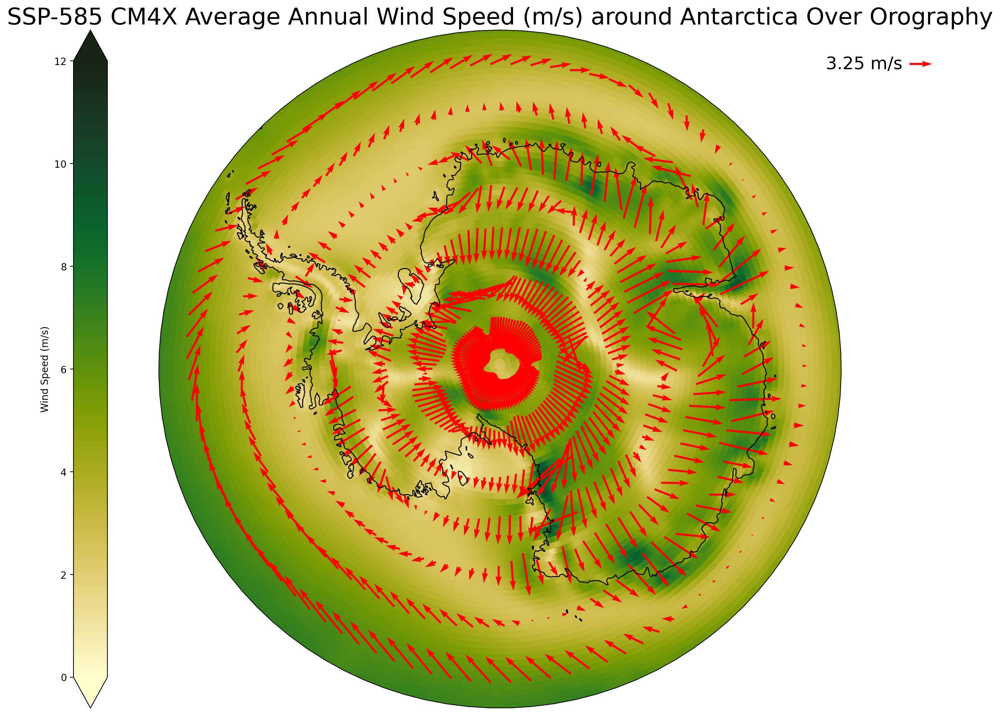

In [95]:
subplot_kws = dict(projection=ccrs.SouthPolarStereo())
fig, ax = plt.subplots(figsize=[15, 10], subplot_kw=subplot_kws)

# Plotting speed slice
cm4x_ssp585_speedslice.plot(ax=ax,
                transform=ccrs.PlateCarree(),
                vmin=0,
                vmax=12,
                extend='both', cmap=cmocean.cm.speed,cbar_kwargs={
                    'orientation': 'vertical',
                    'pad': 0.05,
                    'location': 'left',
                    'label': 'Wind Speed (m/s)'})


# Limit the map to -50 degrees latitude and below
ax.set_extent([-180, 180, -90, -60], ccrs.PlateCarree())

# Create a circular boundary around the plot
theta = np.linspace(0, 2 * np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)
ax.set_boundary(circle, transform=ax.transAxes)
ax.coastlines()

# Calculate the avg magnitude of the vectors
uas = cm4x_ssp585_position['u_ref'].values
vas = cm4x_ssp585_position['v_ref'].values
avg_mag = np.sqrt(uas**2 + vas**2)
avg=avg_mag.mean()


# Plot the quiver and store the Quiver object (chat helped produce tssp585 code)
q = cm4x_ssp585_position.isel(lon=slice(None, None, 6), lat=slice(5, 60, 8)).plot.quiver(
    x='lon',
    y='lat',
    u='u_ref',
    v='v_ref',
    width=0.003,
    scale=98,
    color='red',add_guide = False,
    transform=ccrs.PlateCarree()
)

# Add a quiver key with the automatically determined scale
ax.quiverkey(q, X=1.1, Y=.95, U=avg, label=f'{avg:.2f} m/s', labelpos='W',fontproperties={'size':18})

plt.tight_layout()
plt.title('SSP-585 CM4X Average Annual Wind Speed (m/s) around Antarctica Over Orography',fontsize=24)
plt.show()

---

# ERA5

### uas wind component

In [44]:
era5_uas_open=xr.open_dataset(('/home/tu.temple.edu/tuo15329/era5_wind/era5_10m_u_component_of_wind_1940-2024_monthly_ensemble.nc'),use_cftime=True)
era5_uas_noleap=era5_uas_open.assign_attrs(calendar='noleap')
era5_uas =era5_uas_noleap.mean('expver')#sel(expver=1).combine_first(era5_uas.sel(expver=5))
era5_uas

<xarray.Dataset>
Dimensions:    (longitude: 720, latitude: 361, number: 10, time: 1013)
Coordinates:
  * longitude  (longitude) float32 0.0 0.5 1.0 1.5 ... 358.0 358.5 359.0 359.5
  * latitude   (latitude) float32 90.0 89.5 89.0 88.5 ... -89.0 -89.5 -90.0
  * number     (number) int32 0 1 2 3 4 5 6 7 8 9
  * time       (time) object 1940-01-01 00:00:00 ... 2024-05-01 00:00:00
Data variables:
    u10        (time, number, latitude, longitude) float32 0.6144 ... -2.418

In [45]:
ERA5_uas_95_2014=era5_uas.u10.mean(dim='number').sel(time=slice('1995-01-01','2014-12-01'))
ERA5_uas_95_2014

<xarray.DataArray 'u10' (time: 240, latitude: 361, longitude: 720)>
array([[[-0.9300057 , -0.9300057 , -0.9300057 , ..., -0.9300057 ,
         -0.9300057 , -0.9300057 ],
        [-0.6730398 , -0.677396  , -0.68167704, ..., -0.66380167,
         -0.666881  , -0.6699604 ],
        [-0.8554245 , -0.8605067 , -0.86889374, ..., -0.83917636,
         -0.84520996, -0.85129374],
        ...,
        [-1.9499334 , -1.9461781 , -1.9417467 , ..., -1.9538639 ,
         -1.9530878 , -1.9523369 ],
        [-1.8426304 , -1.8404773 , -1.8383496 , ..., -1.8438075 ,
         -1.8434067 , -1.842981  ],
        [-0.46924955, -0.46924955, -0.46924955, ..., -0.46924955,
         -0.46924955, -0.46924955]],

       [[-0.8365477 , -0.8365477 , -0.8365477 , ..., -0.8365477 ,
         -0.8365477 , -0.8365477 ],
        [-1.639967  , -1.643522  , -1.647052  , ..., -1.6276993 ,
         -1.6317803 , -1.635861  ],
        [-1.7160251 , -1.7213827 , -1.7283427 , ..., -1.6934179 ,
         -1.7015295 , -1.709666  ],
...
        [-2.7767608 , -2.7638927 , -2.7473693 , ..., -2.8080807 ,
         -2.7975402 , -2.7870257 ],
        [-2.594927  , -2.5867655 , -2.5786288 , ..., -2.6114502 ,
         -2.6059678 , -2.60046   ],
        [-0.46917444, -0.46917444, -0.46917444, ..., -0.46917444,
         -0.46917444, -0.46917444]],

       [[-0.8868693 , -0.8868693 , -0.8868693 , ..., -0.8868693 ,
         -0.8868693 , -0.8868693 ],
        [-2.2313342 , -2.2359405 , -2.2404723 , ..., -2.2147105 ,
         -2.2202685 , -2.2258515 ],
        [-2.2488341 , -2.2557938 , -2.2646067 , ..., -2.2184408 ,
         -2.2294564 , -2.2404723 ],
        ...,
        [-2.0839741 , -2.0694287 , -2.0507019 , ..., -2.1247325 ,
         -2.110562  , -2.096442  ],
        [-1.8654131 , -1.8561249 , -1.8467865 , ..., -1.8874947 ,
         -1.8801839 , -1.8727735 ],
        [-0.52963555, -0.52963555, -0.52963555, ..., -0.52963555,
         -0.52963555, -0.52963555]]], dtype=float32)
Coordinates:
  * longitude  (longitude) float32 0.0 0.5 1.0 1.5 ... 358.0 358.5 359.0 359.5
  * latitude   (latitude) float32 90.0 89.5 89.0 88.5 ... -89.0 -89.5 -90.0
  * time       (time) object 1995-01-01 00:00:00 ... 2014-12-01 00:00:00

### vas wind component

In [46]:
era5_vas_open=xr.open_dataset(('/home/tu.temple.edu/tuo15329/era5_wind/era5_10m_v_component_of_wind_1940-2024_monthly_ensemble.nc'),use_cftime=True)
era5_vas_open

<xarray.Dataset>
Dimensions:    (longitude: 720, latitude: 361, number: 10, expver: 2, time: 1013)
Coordinates:
  * longitude  (longitude) float32 0.0 0.5 1.0 1.5 ... 358.0 358.5 359.0 359.5
  * latitude   (latitude) float32 90.0 89.5 89.0 88.5 ... -89.0 -89.5 -90.0
  * number     (number) int32 0 1 2 3 4 5 6 7 8 9
  * expver     (expver) int32 1 5
  * time       (time) object 1940-01-01 00:00:00 ... 2024-05-01 00:00:00
Data variables:
    v10        (time, expver, number, latitude, longitude) float32 ...
Attributes:
    Conventions:  CF-1.6
    history:      2024-06-20 17:07:04 GMT by grib_to_netcdf-2.28.1: /opt/ecmw...

In [47]:
era5_vas_noleap=era5_vas_open.assign_attrs(calendar='noleap')
era5_vas =era5_vas_noleap.mean(dim='expver')
era5_vas

<xarray.Dataset>
Dimensions:    (longitude: 720, latitude: 361, number: 10, time: 1013)
Coordinates:
  * longitude  (longitude) float32 0.0 0.5 1.0 1.5 ... 358.0 358.5 359.0 359.5
  * latitude   (latitude) float32 90.0 89.5 89.0 88.5 ... -89.0 -89.5 -90.0
  * number     (number) int32 0 1 2 3 4 5 6 7 8 9
  * time       (time) object 1940-01-01 00:00:00 ... 2024-05-01 00:00:00
Data variables:
    v10        (time, number, latitude, longitude) float32 -0.8757 ... 2.342

In [48]:
ERA5_vas_95_2014=era5_vas.v10.mean(dim='number').sel(time=slice('1995-01-01','2014-12-01'))
ERA5_vas_95_2014

<xarray.DataArray 'v10' (time: 240, latitude: 361, longitude: 720)>
array([[[ 7.3742932e-01,  7.3742932e-01,  7.3742932e-01, ...,
          7.3742932e-01,  7.3742932e-01,  7.3742932e-01],
        [-2.4880266e-01, -2.4975987e-01, -2.5066391e-01, ...,
         -2.4444208e-01, -2.4585128e-01, -2.4734028e-01],
        [-2.8211844e-01, -2.8310218e-01, -2.8491026e-01, ...,
         -2.7491289e-01, -2.7770472e-01, -2.8057629e-01],
        ...,
        [ 1.9084325e-01,  1.8236142e-01,  1.7029010e-01, ...,
          2.3069987e-01,  2.1620896e-01,  2.0177123e-01],
        [ 2.3798521e-01,  2.3171024e-01,  2.2543530e-01, ...,
          2.5976142e-01,  2.5250268e-01,  2.4527054e-01],
        [ 8.3200568e-01,  8.3200568e-01,  8.3200568e-01, ...,
          8.3200568e-01,  8.3200568e-01,  8.3200568e-01]],

       [[ 8.5332996e-01,  8.5332996e-01,  8.5332996e-01, ...,
          8.5332996e-01,  8.5332996e-01,  8.5332996e-01],
        [ 8.6801253e-02,  9.1321349e-02,  9.5788255e-02, ...,
          7.6910183e-02,  8.0154039e-02,  8.3477654e-02],
        [ 2.0276058e-02,  2.7455043e-02,  3.6309086e-02, ...,
          1.7170549e-03,  8.2047461e-03,  1.4772189e-02],
...
        [ 2.5655959e+00,  2.5734131e+00,  2.5811768e+00, ...,
          1.7977909e+00,  1.8042253e+00,  1.8107131e+00],
        [ 1.8171209e+00,  1.8234227e+00,  1.8295380e+00, ...,
          1.7066710e+00,  1.7205769e+00,  1.7344033e+00],
        [ 1.7482029e+00,  1.7619756e+00,  1.7756956e+00, ...,
          8.9488810e-01,  8.9488810e-01,  8.9488810e-01]],

       [[ 9.2046672e-01,  9.2046672e-01,  9.2046672e-01, ...,
          8.6936301e-01,  8.6936301e-01,  8.6936301e-01],
        [ 8.6936301e-01,  8.6936301e-01,  8.6936301e-01, ...,
          2.2701411e+00,  2.2611272e+00,  2.2522202e+00],
        [ 2.2432065e+00,  2.2342992e+00,  2.2253654e+00, ...,
          2.2462642e+00,  2.2371178e+00,  2.2279713e+00],
        ...,
        [ 2.8365886e+00,  2.8387427e+00,  2.8407636e+00, ...,
          2.3851643e+00,  2.3873179e+00,  2.3893383e+00],
        [ 2.3912530e+00,  2.3932736e+00,  2.3950553e+00, ...,
          2.2958524e+00,  2.3046002e+00,  2.3131881e+00],
        [ 2.3218827e+00,  2.3305240e+00,  2.3390326e+00, ...,
          9.2046660e-01,  9.2046660e-01,  9.2046660e-01]]], dtype=float32)
Coordinates:
  * longitude  (longitude) float32 0.0 0.5 1.0 1.5 ... 358.0 358.5 359.0 359.5
  * latitude   (latitude) float32 90.0 89.5 89.0 88.5 ... -89.0 -89.5 -90.0
  * time       (time) object 1995-01-01 00:00:00 ... 2014-12-01 00:00:00

### merging wind

In [49]:
ERA5_merge_winds=xr.merge([ERA5_vas_95_2014,ERA5_uas_95_2014])
xmerge = ERA5_merge_winds.longitude #extracting the lon component fomr the mergewinds array
ymerge = ERA5_merge_winds.latitude
umerge = ERA5_merge_winds.u10
vmerge = ERA5_merge_winds.v10
era5_speedmerge = np.sqrt(np.square(umerge) + np.square(vmerge)) ## calculating speed using vector sum formula

## speed / magnitude 
era5_speedslice=era5_speedmerge.mean(dim='time')

## position of vectors
era5_position = ERA5_merge_winds.mean(dim='time')
era5_position

<xarray.Dataset>
Dimensions:    (longitude: 720, latitude: 361)
Coordinates:
  * longitude  (longitude) float32 0.0 0.5 1.0 1.5 ... 358.0 358.5 359.0 359.5
  * latitude   (latitude) float32 90.0 89.5 89.0 88.5 ... -89.0 -89.5 -90.0
Data variables:
    v10        (latitude, longitude) float32 0.881 0.881 0.881 ... 0.8956 0.8956
    u10        (latitude, longitude) float32 -0.8064 -0.8064 ... -0.4107 -0.4107

### creating quiver plot

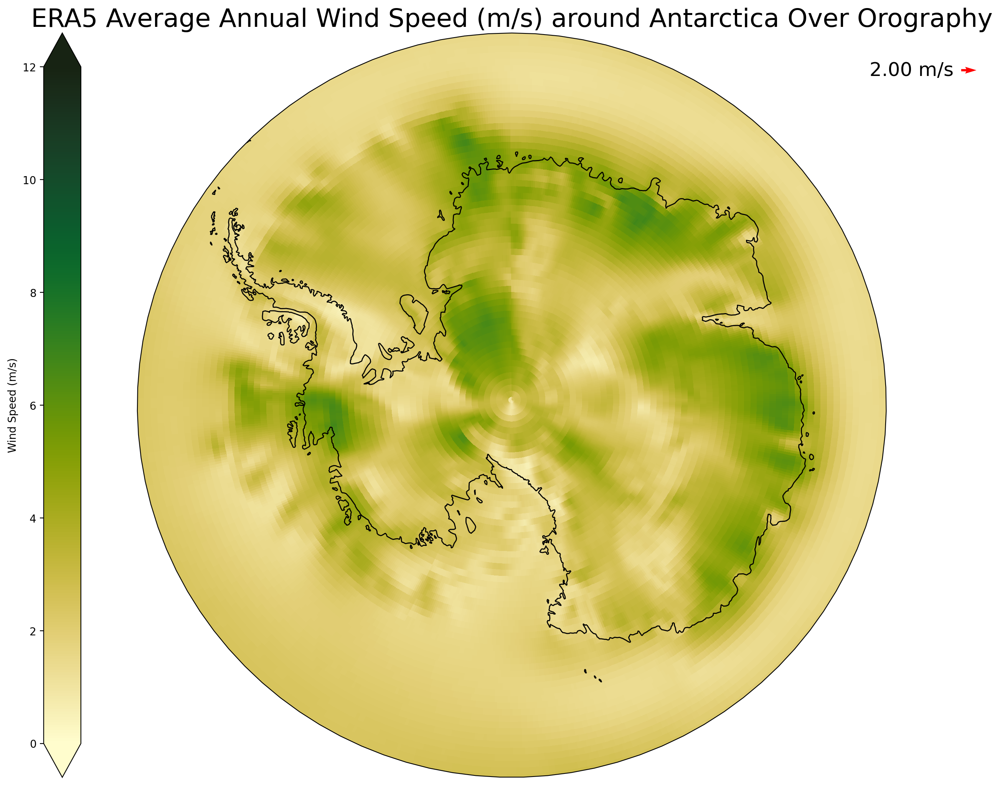

In [50]:
subplot_kws = dict(projection=ccrs.SouthPolarStereo())
fig, ax = plt.subplots(figsize=[15, 10], subplot_kw=subplot_kws)

# Plotting speed slice
era5_speedslice.plot(ax=ax,
                transform=ccrs.PlateCarree(),
                vmin=0,
                vmax=12,
                extend='both', cmap=cmocean.cm.speed,cbar_kwargs={
                    'orientation': 'vertical',
                    'pad': 0.05,
                    'location': 'left',
                    'label': 'Wind Speed (m/s)'})


# Limit the map to -50 degrees latitude and below
ax.set_extent([-180, 180, -90, -60], ccrs.PlateCarree())

# Create a circular boundary around the plot
theta = np.linspace(0, 2 * np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)
ax.set_boundary(circle, transform=ax.transAxes)
ax.coastlines()

# Calculate the avg magnitude of the vectors
uas = era5_position['u10'].values
vas = era5_position['v10'].values
avg_mag = np.sqrt(uas**2 + vas**2)
avg=avg_mag.mean()


# Plot the quiver and store the Quiver object (chat helped produce tssp585 code)
q = era5_position.isel(longitude=slice(None, None, 6), latitude=slice(5, 60, 4)).plot.quiver(
    x='longitude',
    y='latitude',
    u='u10',
    v='v10',
    width=0.003,
    scale=98,
    color='red',add_guide = False,
    transform=ccrs.PlateCarree()
)

# Add a quiver key with the automatically determined scale
ax.quiverkey(q, X=1.1, Y=.95, U=avg, label=f'{avg:.2f} m/s', labelpos='W',fontproperties={'size':18})

plt.tight_layout()
plt.title('ERA5 Average Annual Wind Speed (m/s) around Antarctica Over Orography',fontsize=24)
plt.show()